# Mixture series all patients

In [8]:
# Imports

%load_ext autoreload
%autoreload 2

import io
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pysam
import warnings
from sklearn.metrics import precision_recall_curve, f1_score, average_precision_score
warnings.filterwarnings('ignore')
from sklearn.metrics import confusion_matrix

# set working directory
if not os.getcwd().endswith('cfdna_snv_benchmark'):
    os.chdir('../')
print('Current working directory: {}'.format(os.getcwd()))

from utils.config import Config
from utils.viz import *
from utils.table import *
from utils.metrics import *
from utils.calltable import *
from utils.venn import venn6, get_labels

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Current working directory: /Users/hanae/Repositories/cfdna_snv_benchmark


In [9]:
# Config and Display paramaters

config = Config("config/", "config_viz.yaml")
set_display_params(config)
print(config.methods)

paper
['freebayes', 'mutect2', 'strelka2', 'vardict', 'varscan', 'abemus', 'sinvict', 'cfsnv']


In [17]:
# Chomosome

chrom = '22'
mixtureids =  ['CRC-1014_180816-CW-T_CRC-1014_090516-CW-T', 'CRC-986_100215-CW-T_CRC-986_300316-CW-T', 'CRC-123_310715-CW-T_CRC-123_121115-CW-T']
refnamesnv='inundilutedsamplebyatleast5callers'
refnameindel='inundilutedsamplebyatleast3callers'
#refnamesnv = 'inundilutedsampleranked'
#refnameindel = 'inundilutedsampleranked'
fixedvar='coverage'

In [18]:
def function_to_split(hand,labl,dividor):

    Hand_L=[]
    Hand_M=[]
    Labl_L=[]
    Labl_M=[]

    for h,l in zip(hand,labl):
        co=h.get_color()
        ls=h.get_linestyle()
        lw=h.get_linewidth()
        mk=h.get_marker()
        mew=h.get_markeredgewidth()
        ms=h.get_markersize()

        LABS=l.split(dividor)

        if len(LABS) != 2:
            print('Split Legends Error: Only exactly 1 Dividor is accepted.')
            print('                     Currently ' + str(len(LABS)-1) + ' dividors were given')
            return hand,labl

        #Line and Color
        LICO = plt.Line2D((0,1),(0,0), color=co, marker='', linestyle=ls,linewidth=lw)
        #Marker
        MARK = plt.Line2D((0,1),(0,0), color='k', marker=mk, markeredgewidth=mew, markersize=ms, linestyle='')

        if LABS[0] not in Labl_L:
            Hand_L.append(LICO)
            Labl_L.append(LABS[0])

        if LABS[1] not in Labl_M:
            Hand_M.append(MARK)
            Labl_M.append(LABS[1])

    return Hand_L+Hand_M,Labl_L+Labl_M

In [19]:
markers = ['o', '^', 'X']
linestyles = ['-', '-', '-']
color_dict = {config.methods[i]: config.colors[i] for i in range(len(config.methods))}

In [20]:
muttypes = ['snv', 'indel']
metrics = ['auprc', 'precision', 'recall']

# Mixtures each Patient in one plot

inundilutedsamplebyatleast5callers
(144, 8)
(144, 7)
(144, 7)
inundilutedsamplebyatleast3callers
(168, 8)
(168, 7)
(168, 7)


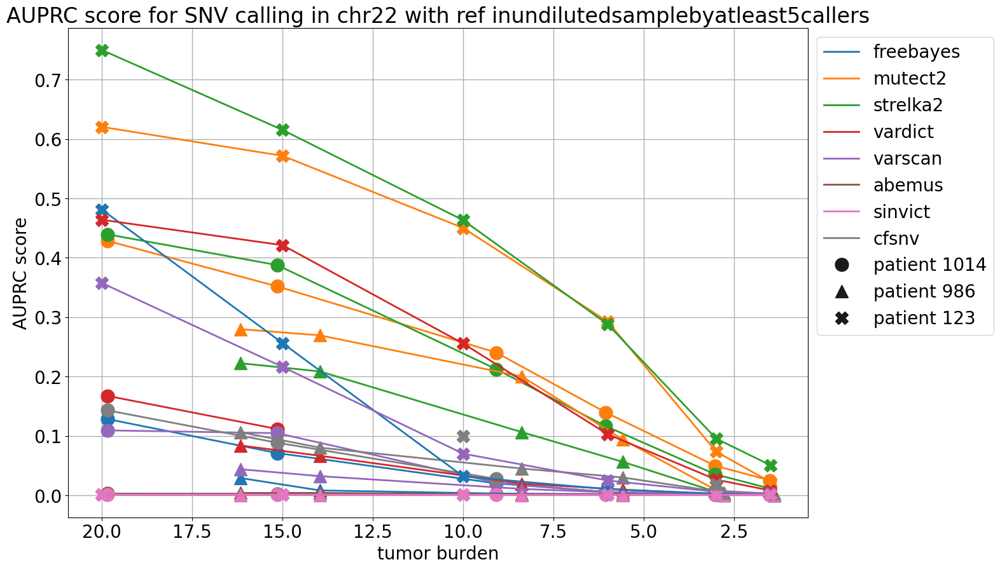

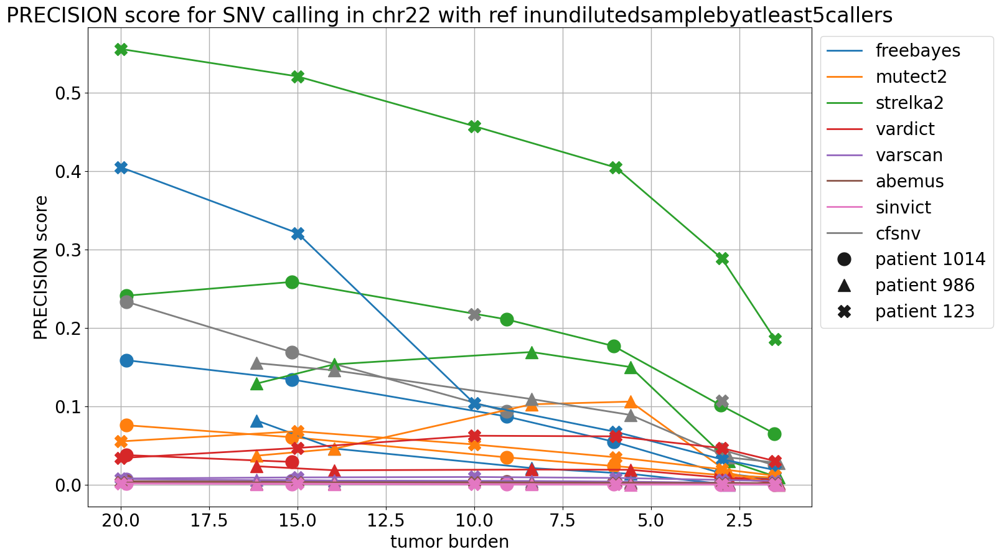

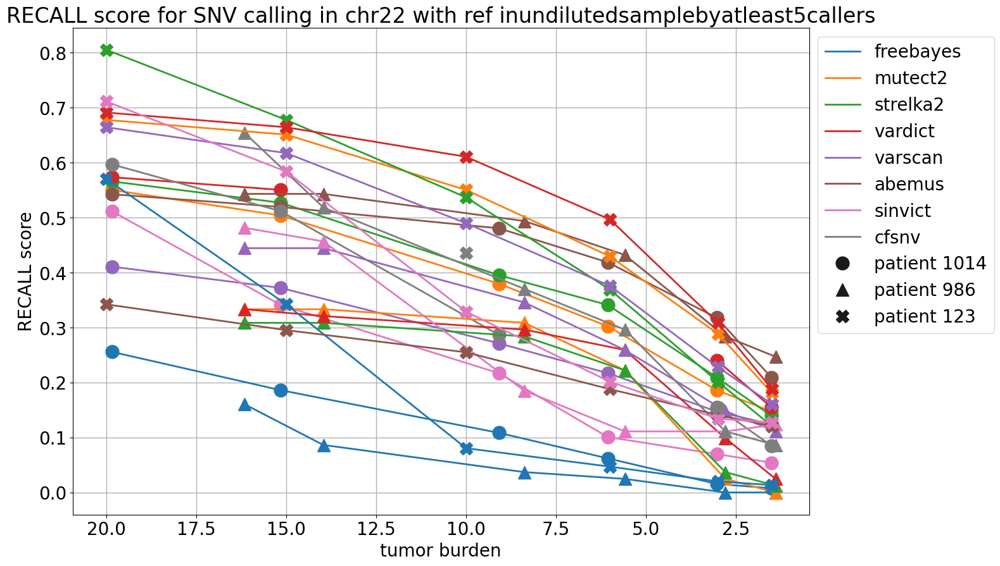

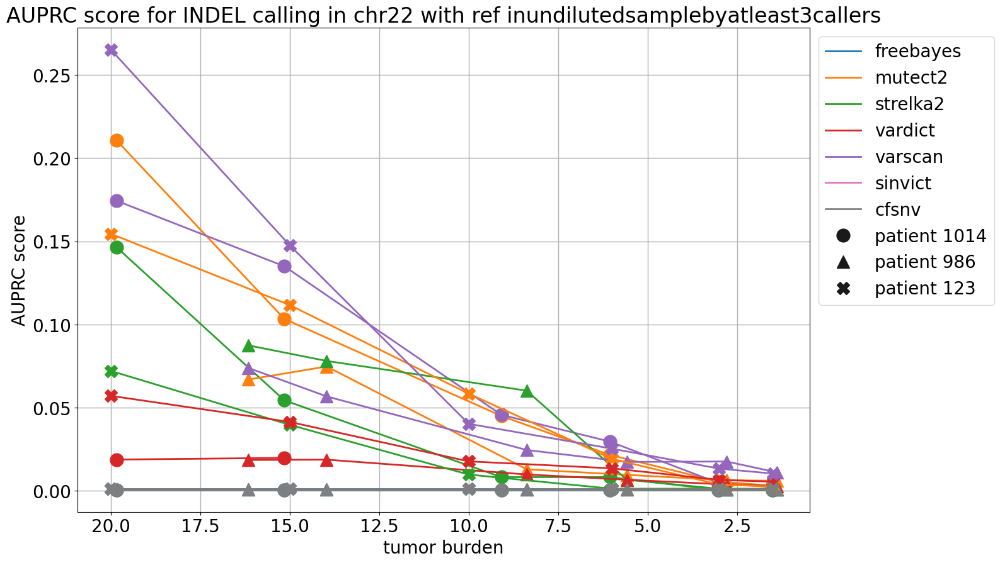

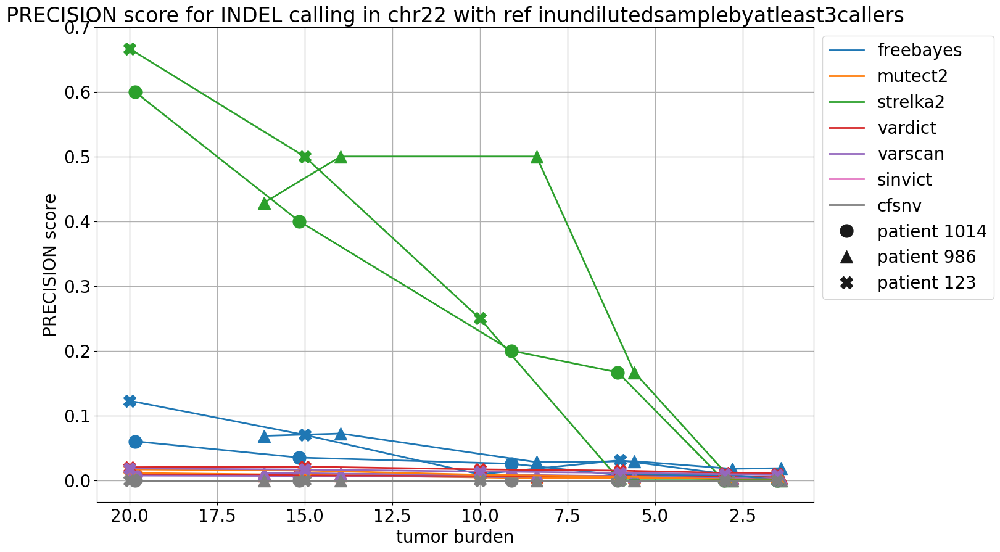

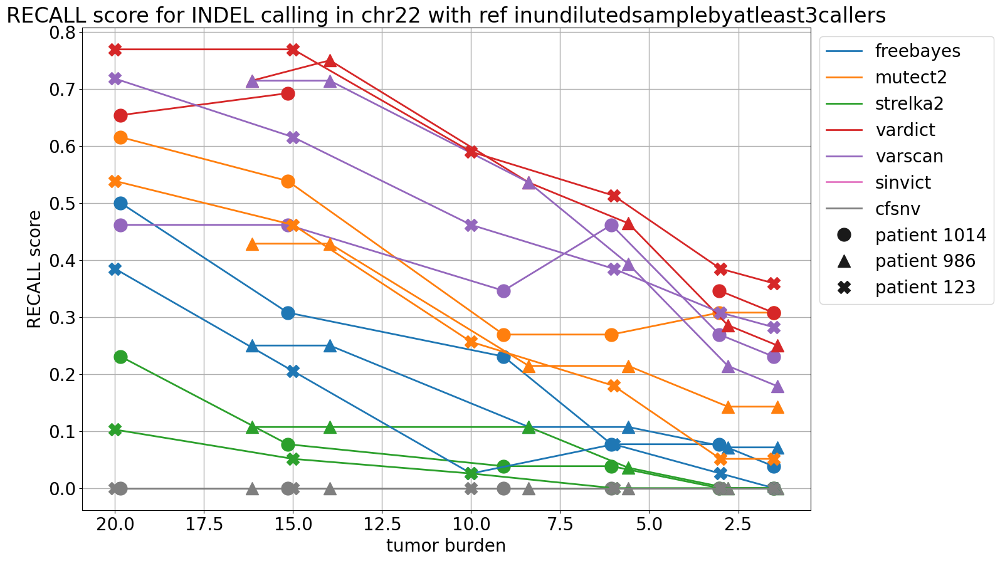

In [24]:
for muttype in muttypes:
    if muttype == 'snv':
        refname = refnamesnv
    elif muttype == 'indel':
        refname = refnameindel
    print(refname)
    for metric in metrics:

        # Save table if do not exist and load tables

        restables = {'snv':[], 'indel':[]}
        for mt in ['snv', 'indel']:
            for mixtureid in mixtureids:
                plasmasample = '_'.join(mixtureid.split('_')[:2])
                restable = pd.read_csv(os.path.join(*config.mixturefolder, 'mixtures_chr'+chrom, 'mixtures_chr'+chrom+'_'+mixtureid, 'results', mixtureid+'_'+mt+'_'+metric+'_'+refname+'_fixed'+fixedvar+'.csv'), index_col=0)
                restables[mt].append(restable)
                
                    
            restables[mt] = pd.concat(restables[mt])
        restables.keys()
        print(restables['snv'].shape)
        restables['snv'].head()
        
        xlab = 'tumor burden' if fixedvar == 'coverage' else 'coverage'

        plt.figure(figsize=(15,10))
        plt.grid(linewidth=1)
        for mi, mixtureid in enumerate(mixtureids):
            plasmasample = '_'.join(mixtureid.split('_')[:2])
            restablesample = restables[muttype][restables[muttype]['plasma sample'] == plasmasample]
            for method in config.methods:
                if muttype == 'indel' and method == 'abemus':
                    pass
                else:
                    if fixedvar == 'coverage':
                        if method == 'vardict' and plasmasample == 'CRC-1014_180816-CW-T':
                            # tmp fix due to Vardict fail
                            locindex1 = restablesample[(restablesample['caller'] == 'vardict') & (restablesample['tumor burden'] ==  9.090)].index[0]
                            restablesample.at[locindex1, metric.upper()+' score'] = np.nan
                            locindex2 = restablesample[(restablesample['caller'] == 'vardict') & (restablesample['tumor burden'] ==  6.059)].index[0]
                            restablesample.at[locindex2, metric.upper()+' score'] = np.nan
                        if method == 'cfsnv' and plasmasample == 'CRC-1014_180816-CW-T' and muttype == 'snv':
                            locindex2 = restablesample[(restablesample['caller'] == 'cfsnv') & (restablesample['tumor burden'] ==  6.059)].index[0]
                            restablesample.at[locindex2, metric.upper()+' score'] = np.nan
                        if method == 'cfsnv' and plasmasample == 'CRC-123_310715-CW-T' and muttype == 'snv':
                            locindex2 = restablesample[(restablesample['caller'] == 'cfsnv') & ((restablesample[xlab]==6.) | (restablesample[xlab]==15.) | (restablesample[xlab]==1.5) | (restablesample[xlab]==20.))].index
                            for li in locindex2:
                                restablesample.at[li, metric.upper()+' score'] = np.nan
                    if fixedvar == 'ctdna':
                        if plasmasample == 'CRC-123_310715-CW-T':
                            restablesample = restablesample[restablesample['coverage'] != 250]
                    plt.plot(restablesample[restablesample['caller'] == method][xlab], restablesample[restablesample['caller'] == method][metric.upper()+' score'],
                          c=color_dict[method], marker=markers[mi], markersize=15, lw=2, ls=linestyles[mi], label = method + '*' + 'patient '+plasmasample.split('_')[0].split('-')[1])
        if fixedvar == 'coverage':
            plt.gca().invert_xaxis()
        ax = plt.gca()
        hand, labl = ax.get_legend_handles_labels()
        hand, labl = function_to_split(hand,labl,'*')
        ax.legend(hand,labl, bbox_to_anchor=(1,1), loc="upper left")
        plt.xlabel(xlab)
        plt.ylabel(metric.upper()+' score')
        plt.title(metric.upper() + " score for {} calling in chr{} with ref {}".format(muttype.upper(), chrom, refname))
        if save:
            if not os.path.exists(os.path.join(*dilfolder, 'figures')):
                os.mkdir(os.path.join(*dilfolder, 'figures'))
            if methods != config.methods:
                plt.savefig(os.path.join(*dilfolder, 'figures',  metric + '_' + muttype + '_' + chrom + '_' + refname + '_' + '_'.join(methods) + '_' + config.context), bbox_inches='tight')
            else:
                plt.savefig(os.path.join(*dilfolder, 'figures',metric + '_' + muttype + '_' + chrom + '_' + refname + '_' + config.context), bbox_inches='tight')
        plt.show()

(144, 8)
(144, 7)
(144, 7)
(168, 8)
(168, 7)
(168, 7)


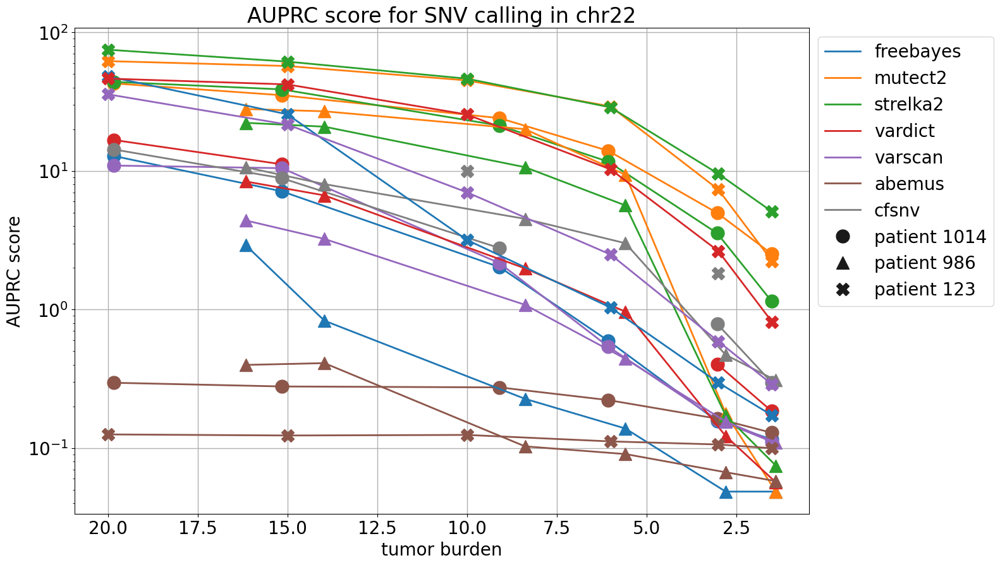

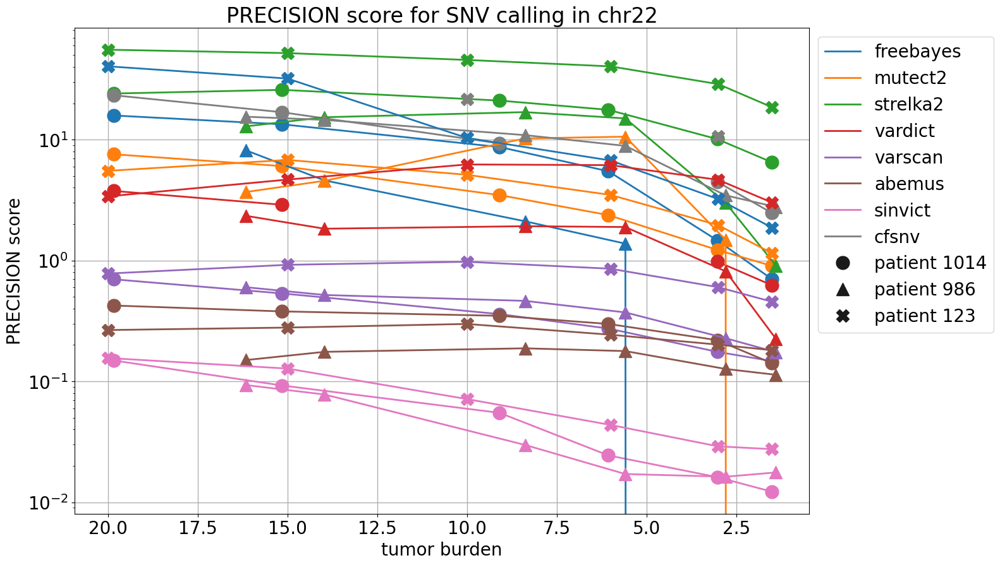

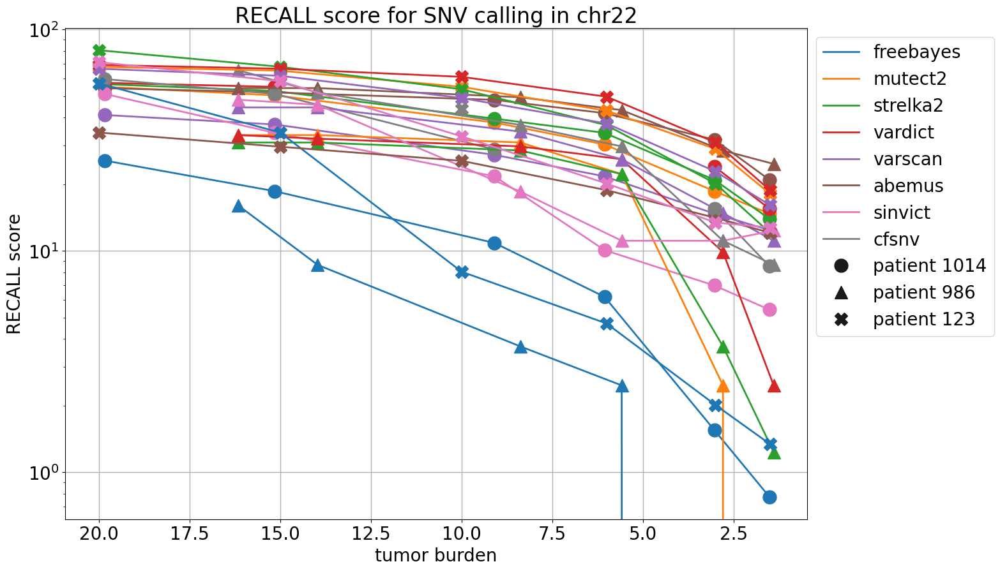

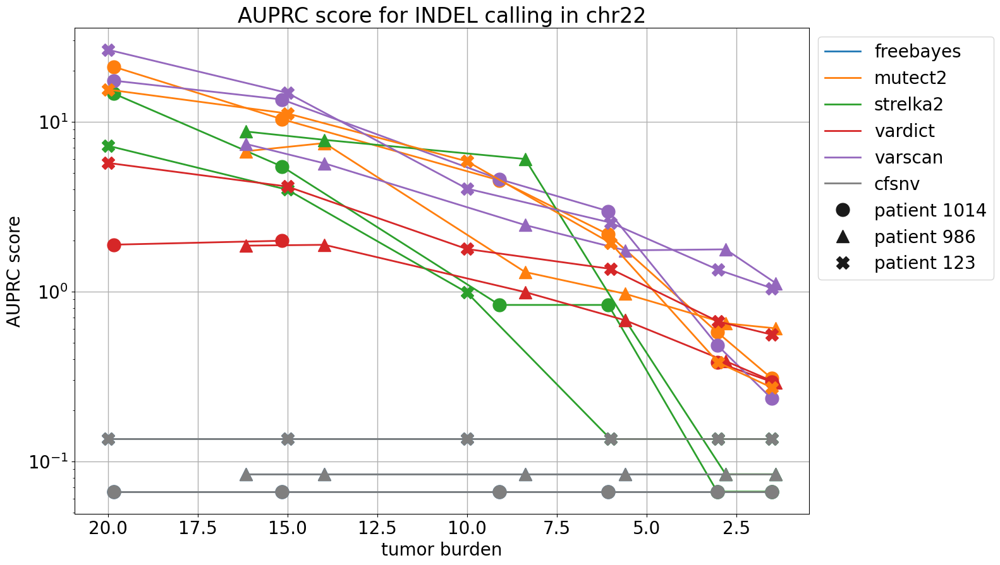

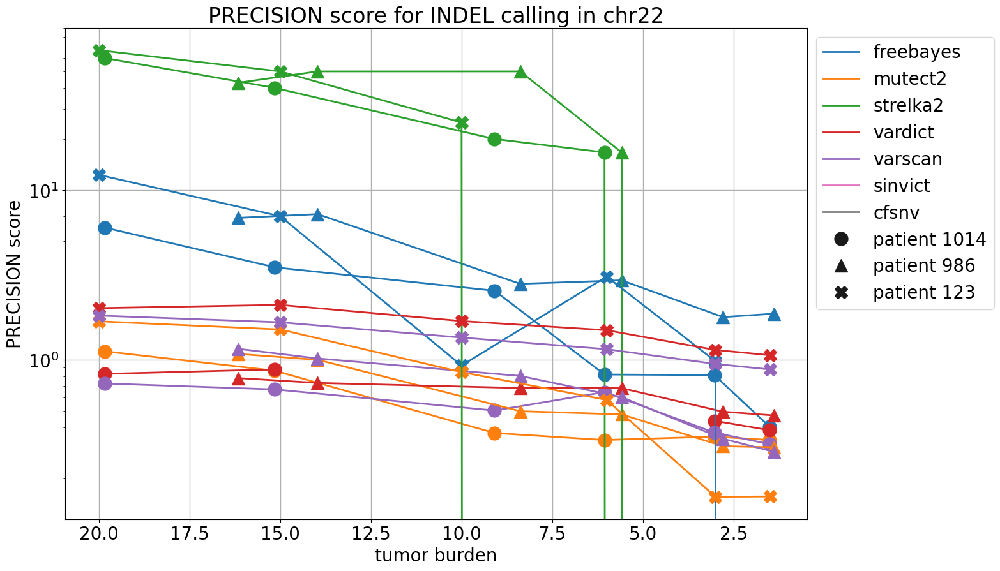

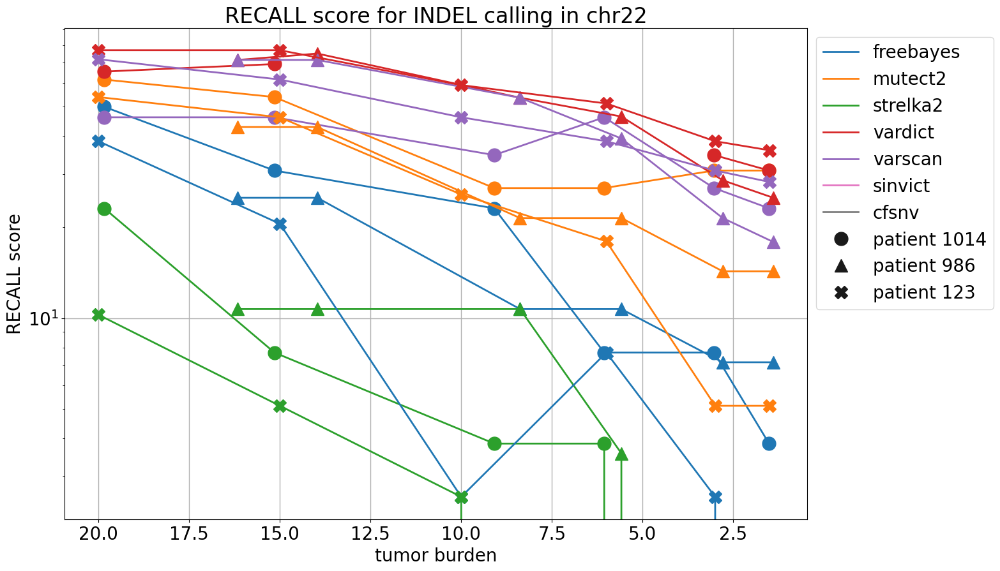

In [22]:
for muttype in muttypes:
    if muttype == 'snv':
        refname = refnamesnv
    elif muttype == 'indel':
        refname = refnameindel
    for metric in metrics:

        # Save table if do not exist and load tables

        restables = {'snv':[], 'indel':[]}
        for mt in ['snv', 'indel']:
            for mixtureid in mixtureids:
                plasmasample = '_'.join(mixtureid.split('_')[:2])
                restable = pd.read_csv(os.path.join(*config.mixturefolder, 'mixtures_chr'+chrom, 'mixtures_chr'+chrom+'_'+mixtureid, 'results', mixtureid+'_'+mt+'_'+metric+'_'+refname+'_fixed'+fixedvar+'.csv'), index_col=0)
                restables[mt].append(restable)
                
                    
            restables[mt] = pd.concat(restables[mt])
        restables.keys()
        print(restables['snv'].shape)
        restables['snv'].head()
        
        xlab = 'tumor burden' if fixedvar == 'coverage' else 'coverage'
        
        plt.figure(figsize=(15,10))
        plt.grid(linewidth=1)
        for mi, mixtureid in enumerate(mixtureids):
            plasmasample = '_'.join(mixtureid.split('_')[:2])
            restablesample = restables[muttype][restables[muttype]['plasma sample'] == plasmasample]
            for method in config.methods:
                #print(method, muttype, plasmasample, fixedvar)
                if metric == 'auprc' and method.startswith('sinvict'):
                    pass
                elif muttype == 'indel' and method == 'abemus':
                    pass
                else:
                    if fixedvar == 'coverage':
                        if method == 'vardict' and plasmasample == 'CRC-1014_180816-CW-T':
                            # tmp fix due to Vardict fail
                            locindex1 = restablesample[(restablesample['caller'] == 'vardict') & (restablesample[xlab] ==  9.090)].index[0]
                            restablesample.at[locindex1, metric.upper()+' score'] = np.nan
                            locindex2 = restablesample[(restablesample['caller'] == 'vardict') & (restablesample[xlab] ==  6.059)].index[0]
                            restablesample.at[locindex2, metric.upper()+' score'] = np.nan
                        if method == 'cfsnv' and plasmasample == 'CRC-1014_180816-CW-T' and muttype == 'snv':
                            locindex2 = restablesample[(restablesample['caller'] == 'cfsnv') & (restablesample[xlab] ==  6.059)].index[0]
                            restablesample.at[locindex2, metric.upper()+' score'] = np.nan
                        if method == 'cfsnv' and plasmasample == 'CRC-123_310715-CW-T' and muttype == 'snv':
                            locindex2 = restablesample[(restablesample['caller'] == 'cfsnv') & ((restablesample[xlab]==6.) | (restablesample[xlab]==15.) | (restablesample[xlab]==1.5) | (restablesample[xlab]==20.))].index
                            for li in locindex2:
                                restablesample.at[li, metric.upper()+' score'] = np.nan
                    if fixedvar == 'ctdna':
                        if plasmasample == 'CRC-123_310715-CW-T':
                            restablesample = restablesample[restablesample['coverage'] != 250]
                    plt.plot(restablesample[restablesample['caller'] == method][xlab], 100*restablesample[restablesample['caller'] == method][metric.upper()+' score'],
                          c=color_dict[method], marker=markers[mi], markersize=15, lw=2, ls=linestyles[mi], label = method + '*' + 'patient '+plasmasample.split('_')[0].split('-')[1])
                
        if fixedvar == 'coverage':
            plt.gca().invert_xaxis()    
        plt.xlabel(xlab)
        plt.ylabel(metric.upper()+' score')
        plt.title(metric.upper() + " score for {} calling in chr{}".format(muttype.upper(), chrom))
        plt.semilogy()
        ax = plt.gca()
        hand, labl = ax.get_legend_handles_labels()
        hand, labl = function_to_split(hand,labl,'*')
        ax.legend(hand,labl, bbox_to_anchor=(1,1), loc="upper left")

# Mixtures one Patient in each plot

(144, 8)
(144, 7)
(144, 7)
(168, 8)
(168, 7)
(168, 7)


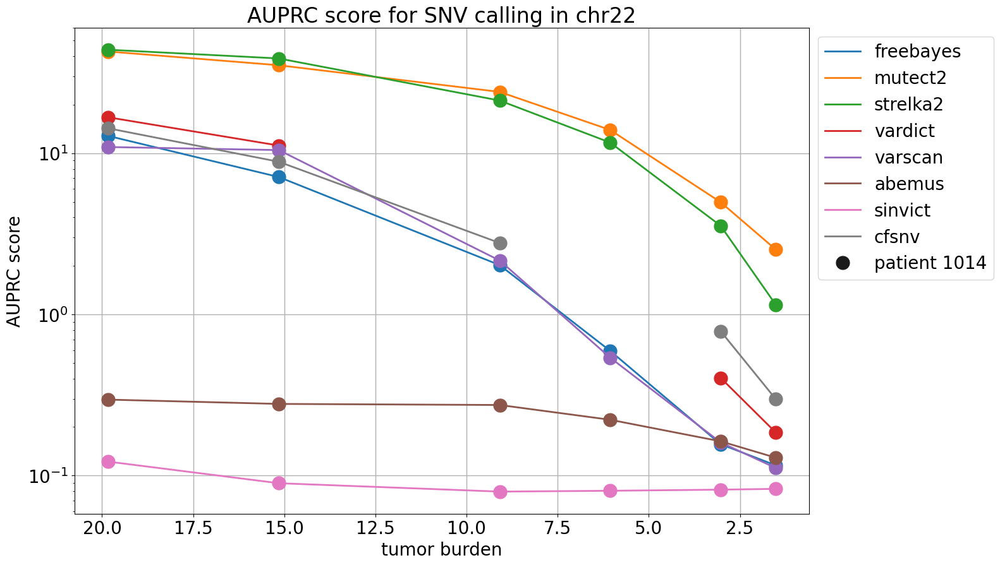

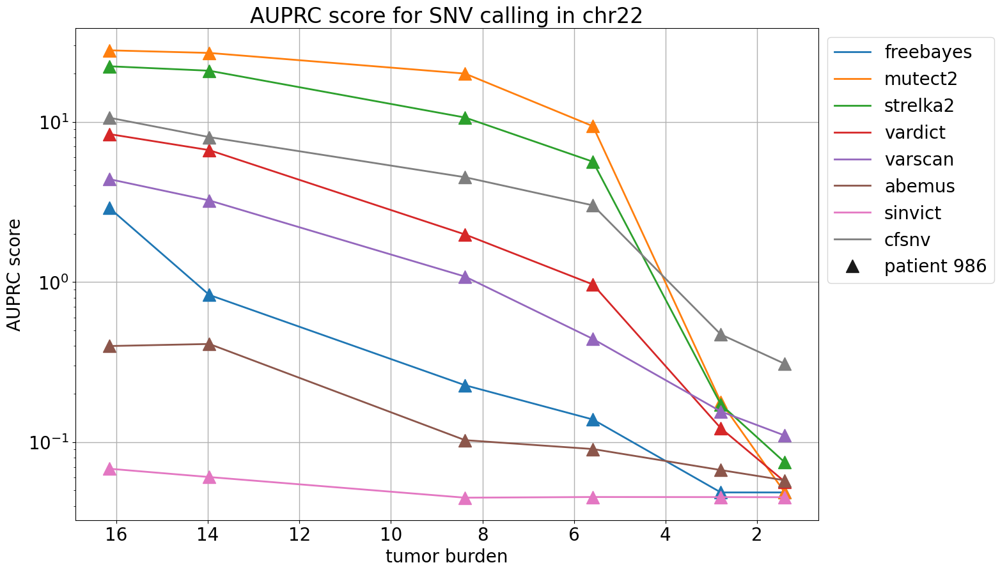

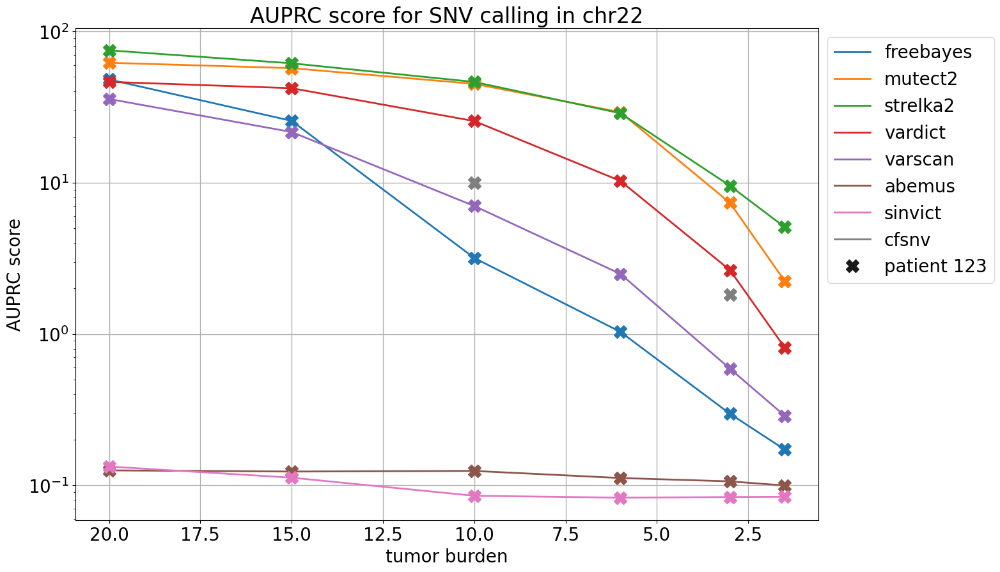

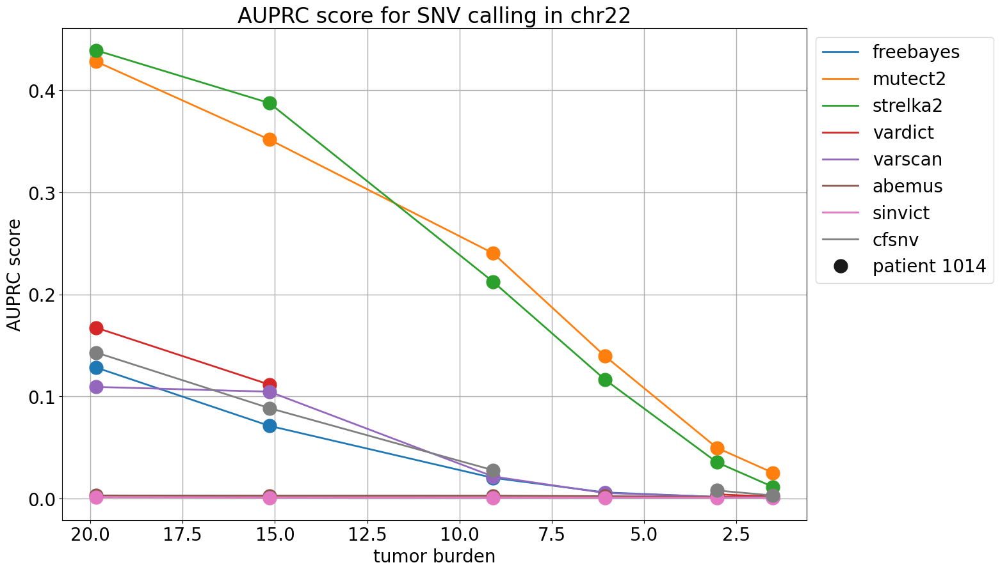

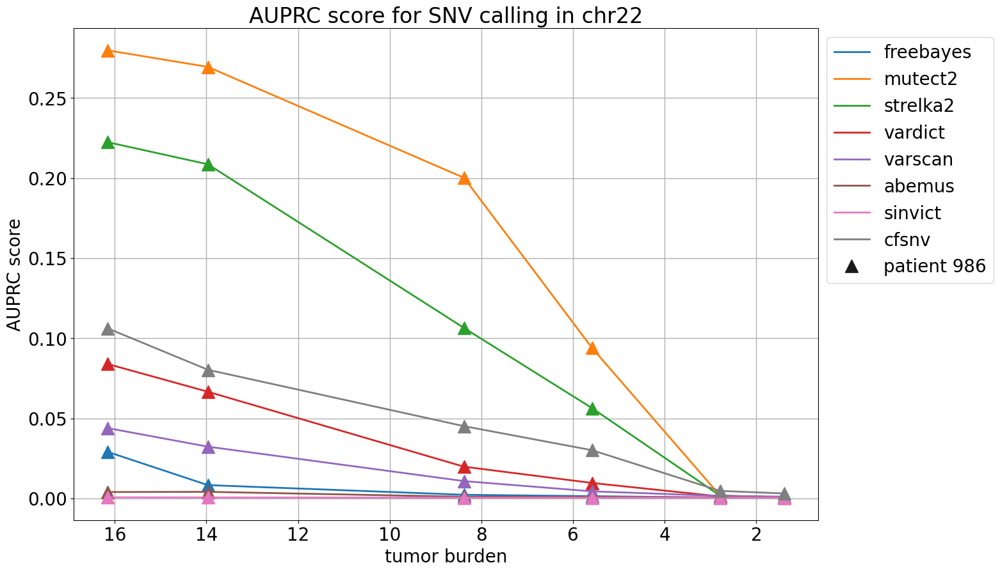

...

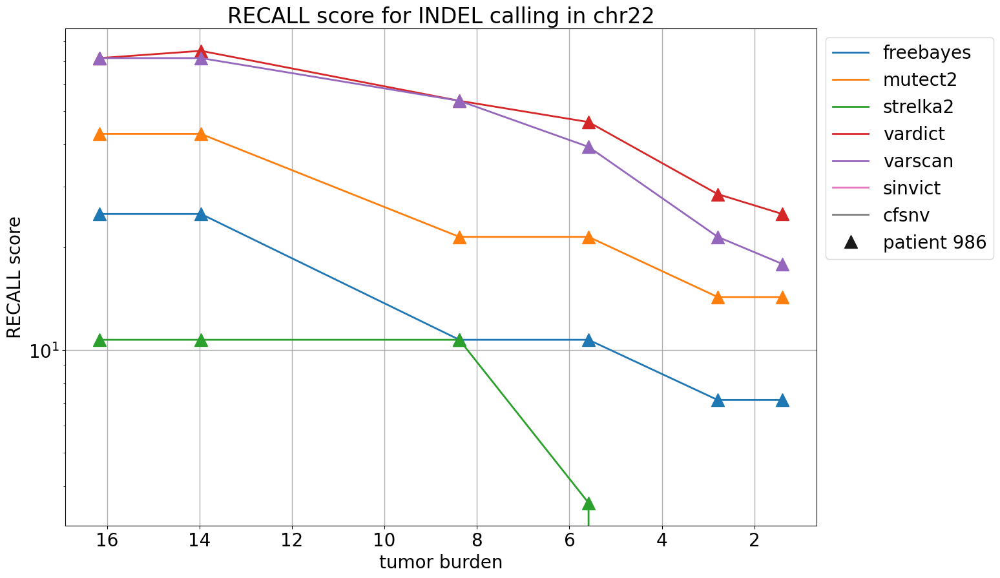

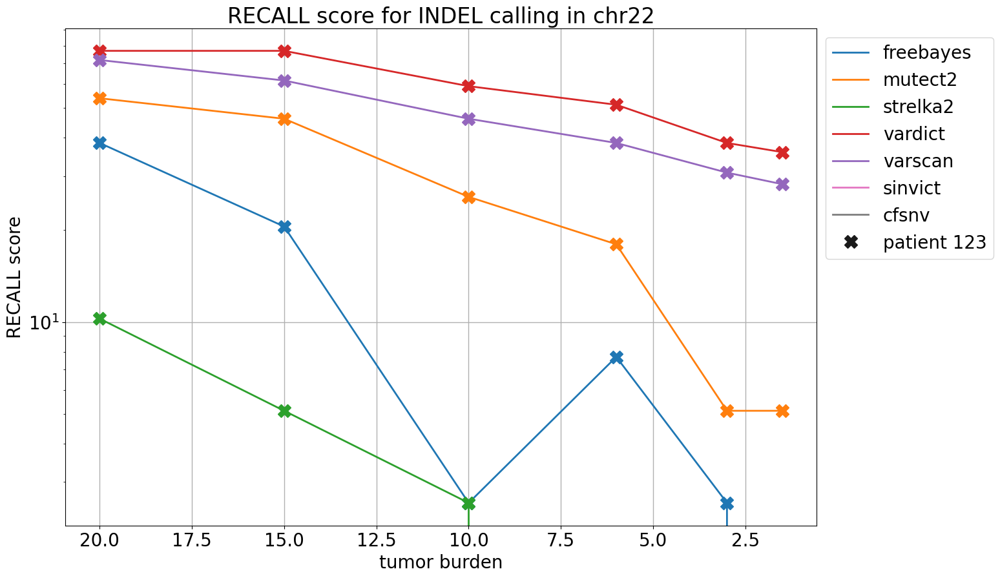

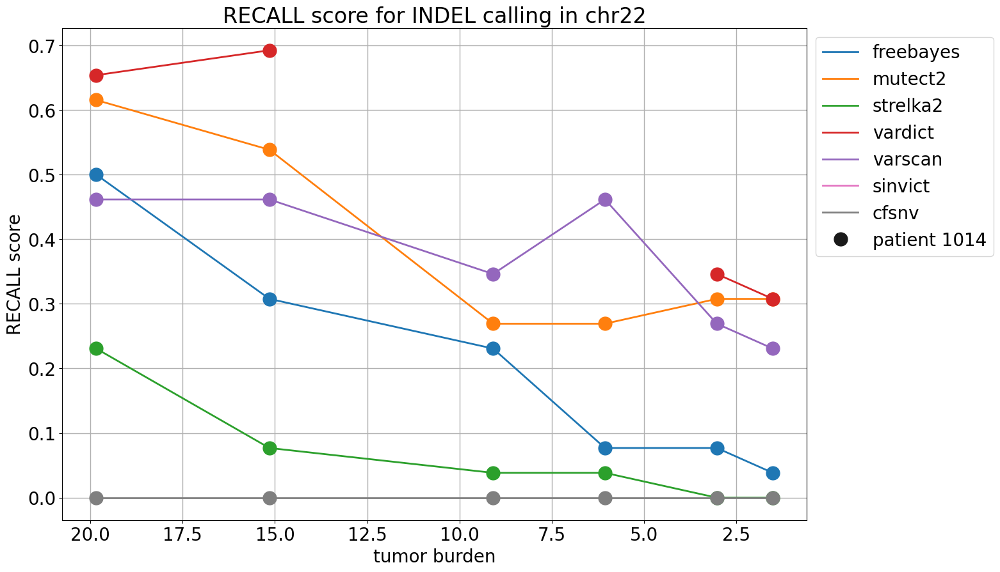

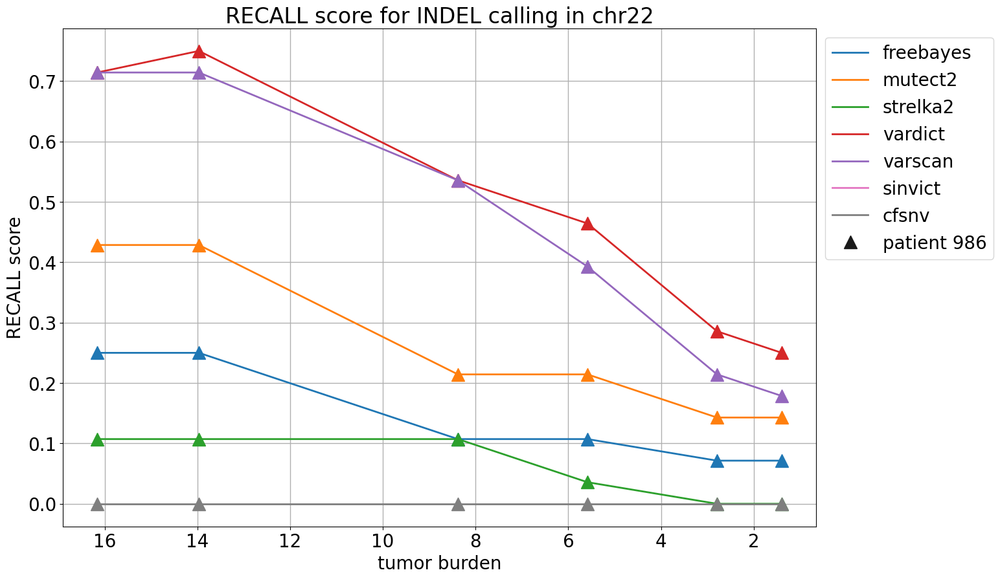

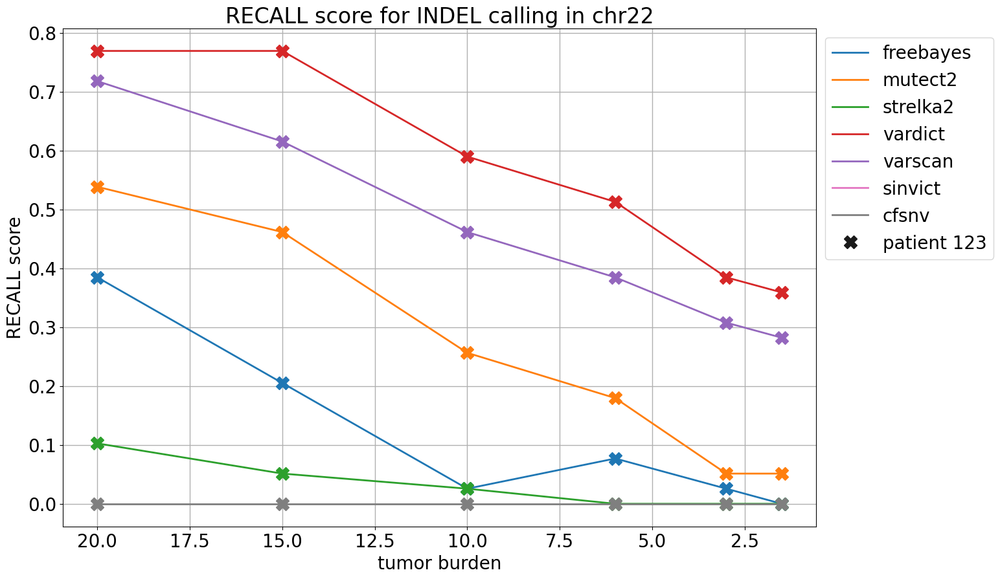

In [23]:
for muttype in muttypes:
    if muttype == 'snv':
        refname = refnamesnv
    elif muttype == 'indel':
        refname = refnameindel
    for metric in metrics:

        # Save table if do not exist and load tables

        restables = {'snv':[], 'indel':[]}
        for mt in ['snv', 'indel']:
            for mixtureid in mixtureids:
                plasmasample = '_'.join(mixtureid.split('_')[:2])
                restable = pd.read_csv(os.path.join(*config.mixturefolder, 'mixtures_chr'+chrom, 'mixtures_chr'+chrom+'_'+mixtureid, 'results', mixtureid+'_'+mt+'_'+metric+'_'+refname+'_fixed'+fixedvar+'.csv'), index_col=0)
                restables[mt].append(restable)
                
                    
            restables[mt] = pd.concat(restables[mt])
        restables.keys()
        print(restables['snv'].shape)
        restables['snv'].head()
        
        xlab = 'tumor burden' if fixedvar == 'coverage' else 'coverage'
        for mi, mixtureid in enumerate(mixtureids):
            plt.figure(figsize=(15,10))
            plt.grid(linewidth=1)
            plasmasample = '_'.join(mixtureid.split('_')[:2])
            restablesample = restables[muttype][restables[muttype]['plasma sample'] == plasmasample]
            for method in config.methods:
                if muttype == 'indel' and method == 'abemus':
                    pass
                else:
                    if fixedvar == 'coverage':
                        if method == 'vardict' and plasmasample == 'CRC-1014_180816-CW-T':
                            # tmp fix due to Vardict fail
                            locindex1 = restablesample[(restablesample['caller'] == 'vardict') & (restablesample[xlab] ==  9.090)].index[0]
                            restablesample.at[locindex1, metric.upper()+' score'] = np.nan
                            locindex2 = restablesample[(restablesample['caller'] == 'vardict') & (restablesample[xlab] ==  6.059)].index[0]
                            restablesample.at[locindex2, metric.upper()+' score'] = np.nan
                        if method == 'cfsnv' and plasmasample == 'CRC-1014_180816-CW-T' and muttype == 'snv':
                            locindex2 = restablesample[(restablesample['caller'] == 'cfsnv') & (restablesample[xlab] ==  6.059)].index[0]
                            restablesample.at[locindex2, metric.upper()+' score'] = np.nan
                        if method == 'cfsnv' and plasmasample == 'CRC-123_310715-CW-T' and muttype == 'snv':
                            locindex2 = restablesample[(restablesample['caller'] == 'cfsnv') & ((restablesample[xlab]==6.) | (restablesample[xlab]==15.) | (restablesample[xlab]==1.5) | (restablesample[xlab]==20.))].index
                            for li in locindex2:
                                restablesample.at[li, metric.upper()+' score'] = np.nan
                    if fixedvar == 'ctdna':
                        if plasmasample == 'CRC-123_310715-CW-T':
                            restablesample = restablesample[restablesample['coverage'] != 250]
                    plt.plot(restablesample[restablesample['caller'] == method][xlab], 100*restablesample[restablesample['caller'] == method][metric.upper()+' score'],
                          c=color_dict[method], marker=markers[mi], markersize=15, lw=2, ls=linestyles[mi], label = method + '*' + 'patient '+plasmasample.split('_')[0].split('-')[1])
                
            if fixedvar == 'coverage':
                plt.gca().invert_xaxis()    
            plt.xlabel(xlab)
            plt.ylabel(metric.upper()+' score')
            plt.title(metric.upper() + " score for {} calling in chr{}".format(muttype.upper(), chrom))
            plt.semilogy()
            ax = plt.gca()
            hand, labl = ax.get_legend_handles_labels()
            hand, labl = function_to_split(hand,labl,'*')
            ax.legend(hand,labl, bbox_to_anchor=(1,1), loc="upper left")

        for mi, mixtureid in enumerate(mixtureids):
            plt.figure(figsize=(15,10))
            plt.grid(linewidth=1)
        
            plasmasample = '_'.join(mixtureid.split('_')[:2])
            restablesample = restables[muttype][restables[muttype]['plasma sample'] == plasmasample]
            for method in config.methods:
                if muttype == 'indel' and method == 'abemus':
                    pass
                else:
                    if fixedvar == 'coverage':
                        if method == 'vardict' and plasmasample == 'CRC-1014_180816-CW-T':
                            # tmp fix due to Vardict fail
                            locindex1 = restablesample[(restablesample['caller'] == 'vardict') & (restablesample['tumor burden'] ==  9.090)].index[0]
                            restablesample.at[locindex1, metric.upper()+' score'] = np.nan
                            locindex2 = restablesample[(restablesample['caller'] == 'vardict') & (restablesample['tumor burden'] ==  6.059)].index[0]
                            restablesample.at[locindex2, metric.upper()+' score'] = np.nan
                        if method == 'cfsnv' and plasmasample == 'CRC-1014_180816-CW-T' and muttype == 'snv':
                            locindex2 = restablesample[(restablesample['caller'] == 'cfsnv') & (restablesample['tumor burden'] ==  6.059)].index[0]
                            restablesample.at[locindex2, metric.upper()+' score'] = np.nan
                        if method == 'cfsnv' and plasmasample == 'CRC-123_310715-CW-T' and muttype == 'snv':
                            locindex2 = restablesample[(restablesample['caller'] == 'cfsnv') & ((restablesample[xlab]==6.) | (restablesample[xlab]==15.) | (restablesample[xlab]==1.5) | (restablesample[xlab]==20.))].index
                            for li in locindex2:
                                restablesample.at[li, metric.upper()+' score'] = np.nan
                    if fixedvar == 'ctdna':
                        if plasmasample == 'CRC-123_310715-CW-T':
                            restablesample = restablesample[restablesample['coverage'] != 250]
                    plt.plot(restablesample[restablesample['caller'] == method][xlab], restablesample[restablesample['caller'] == method][metric.upper()+' score'],
                          c=color_dict[method], marker=markers[mi], markersize=15, lw=2, ls=linestyles[mi], label = method + '*' + 'patient '+plasmasample.split('_')[0].split('-')[1])
            if fixedvar == 'coverage':
                plt.gca().invert_xaxis()
            ax = plt.gca()
            hand, labl = ax.get_legend_handles_labels()
            hand, labl = function_to_split(hand,labl,'*')
            ax.legend(hand,labl, bbox_to_anchor=(1,1), loc="upper left")
            plt.xlabel(xlab)
            plt.ylabel(metric.upper()+' score')
            plt.title(metric.upper() + " score for {} calling in chr{}".format(muttype.upper(), chrom))